In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# --- STEP 1: ENVIRONMENT SETUP ---
!git clone https://github.com/facebookresearch/detr.git
import os
os.chdir('detr')

fatal: destination path 'detr' already exists and is not an empty directory.


In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from PIL import Image
import matplotlib.pyplot as plt
import requests
import numpy as np
from collections import OrderedDict

In [4]:
from models.detr import DETR, SetCriterion 
from models.matcher import HungarianMatcher 
from models.transformer import Transformer 
from models.backbone import build_backbone 
from util.misc import nested_tensor_from_tensor_list 
from util.box_ops import box_cxcywh_to_xyxy, generalized_box_iou
from models import build_model

In [6]:
import sys
sys.path.append('/kaggle/working/detr')

from models import build_model
from util.box_ops import box_cxcywh_to_xyxy

In [7]:
PASCAL_VOC_CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

# Define some colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# Standard transformations for DETR
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [8]:
class Args:
    # Hyperparameters
    lr = 1e-4
    lr_backbone = 1e-5
    batch_size = 2
    weight_decay = 1e-4
    epochs = 10 
    clip_max_norm = 0.1

    # Model parameters
    frozen_weights = None
    backbone = 'resnet50'
    dilation = False
    position_embedding = 'sine'
    enc_layers = 6
    dec_layers = 6
    dim_feedforward = 2048
    hidden_dim = 256
    dropout = 0.1
    nheads = 8
    num_queries = 100
    pre_norm = False
    masks = False # action='store_true' default is False

    # Loss
    aux_loss = True

    # Matcher (HungarianMatcher costs)
    set_cost_class = 1.0
    set_cost_bbox = 5.0
    set_cost_giou = 2.0

    # Loss coefficients (for SetCriterion)
    mask_loss_coef = 1.0
    dice_loss_coef = 1.0
    bbox_loss_coef = 5.0
    giou_loss_coef = 2.0
    ciou_loss_coef = 2.0 
    eos_coef = 0.1

    # Dataset parameters
    dataset_file = 'voc' 
    coco_path = '/kaggle/working/detr/voc_coco_format'
    coco_panoptic_path = None 
    remove_difficult = False 

    # General
    output_dir = '/kaggle/working/detr/outputs'
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    seed = 42
    resume = ''
    start_epoch = 0
    eval = False # action='store_true' default is False
    num_workers = 2

args = Args()

model_actual, criterion, postprocessors = build_model(args)
model_actual.to(args.device)
criterion.to(args.device) 

print("Model architecture built and moved to device.")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model architecture built and moved to device.


In [9]:
# --- STEP 4: LOAD THE SAVED .pth WEIGHTS ---

model_weights_path = '/kaggle/input/detr-output/detr_ciou_voc_final.pth'

if not os.path.exists(model_weights_path):
    print(f"ERROR: Model file not found at '{model_weights_path}'")
    print("Please update the path to point to your saved .pth file from the training notebook.")
else:
    model_actual.load_state_dict(torch.load(model_weights_path, map_location=args.device))
    model_actual.eval() # Set model to evaluation mode
    print("Model weights loaded successfully!")

Model weights loaded successfully!


In [10]:
# --- STEP 5: INFERENCE AND VISUALIZATION ---
# Function to perform inference on a single image
def detect(im, model, transform, prob_threshold=0.7):
    # Mean-std normalize the input image
    img = transform(im).unsqueeze(0)
    img = img.to(args.device)

    # Propagate through the model
    outputs = model(img)

    # Keep only predictions with confidence above a threshold
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > prob_threshold
    
    # Convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    
    return probas[keep], bboxes_scaled

# Function to rescale bounding boxes
def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32).to(args.device)
    return b

# Function to plot results
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{PASCAL_VOC_CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/72e16f7160358c50_jpg.rf.43ab0d7684390f4c28a098404164f5f8.jpg


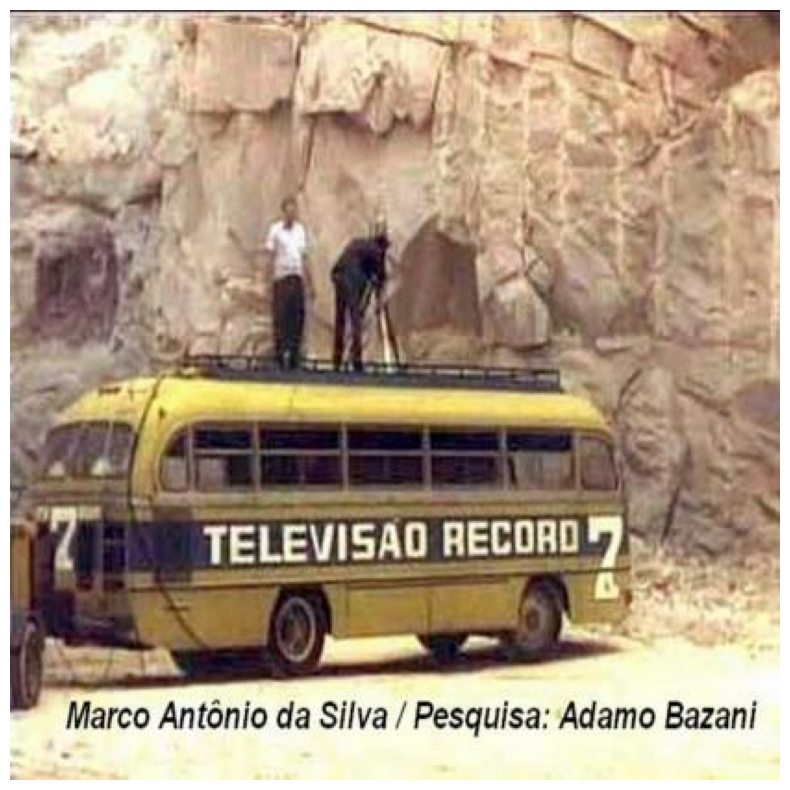


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/259ff749ac781352_jpg.rf.8acc4aba3916d2dd58c3acca8890194b.jpg


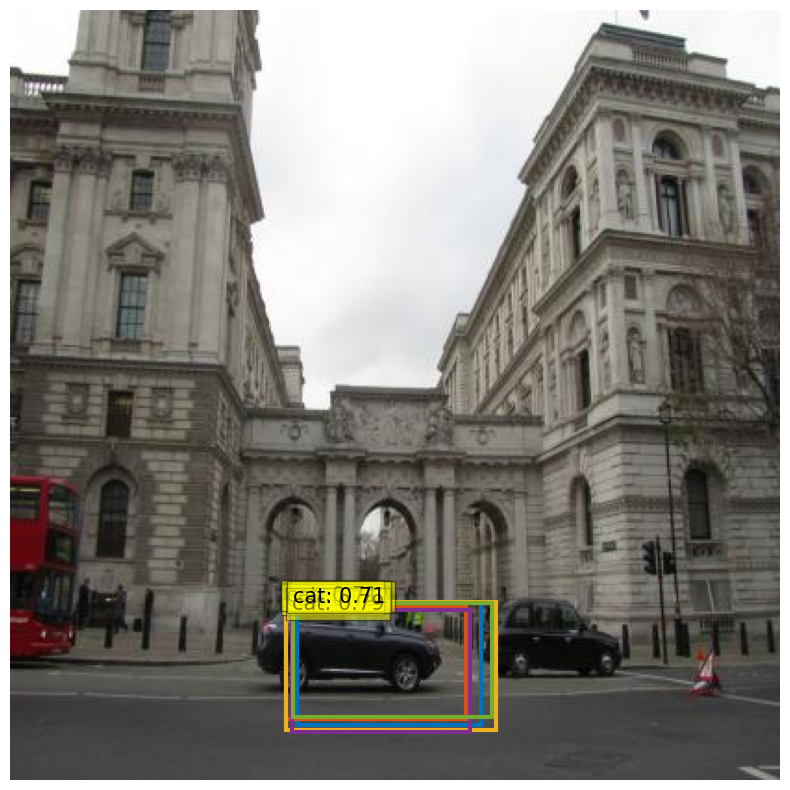


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/958efc095c686ef6_jpg.rf.963de21446d75d8452e417c3c262b9a8.jpg


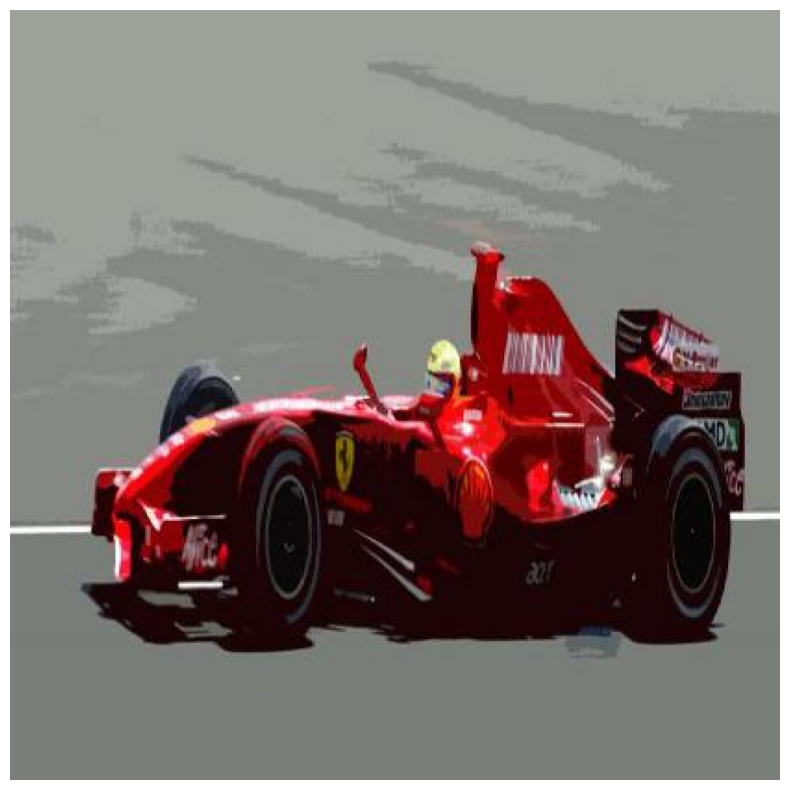


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/7baf801decfab71a_jpg.rf.1atdX9M2VU1J7hd8ePoy.jpg


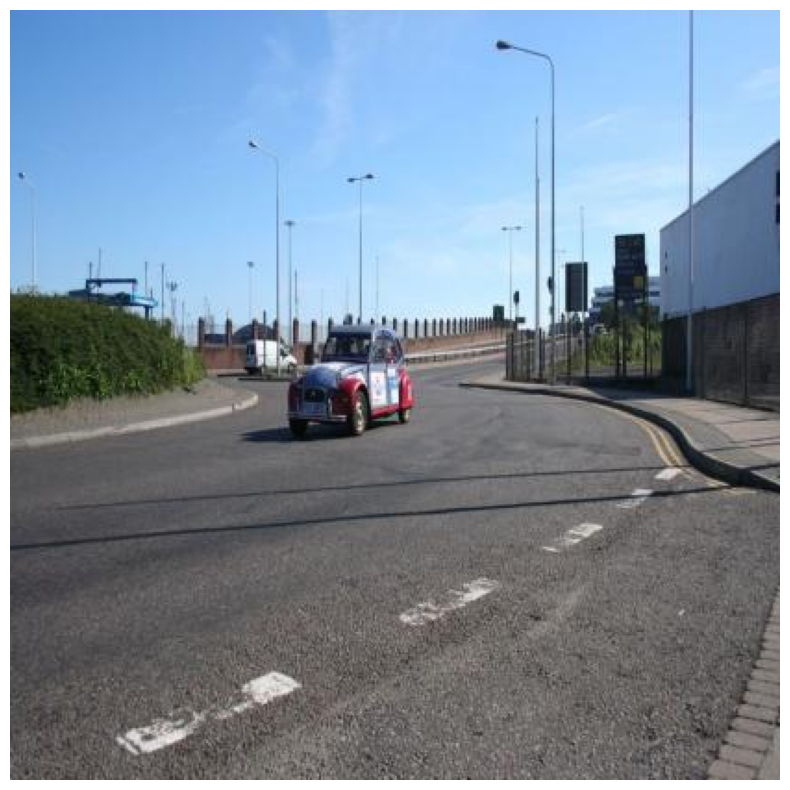


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/a3cffcdbff959432_jpg.rf.1f1f8cfcdfe052a8ec72e63b11889b66.jpg


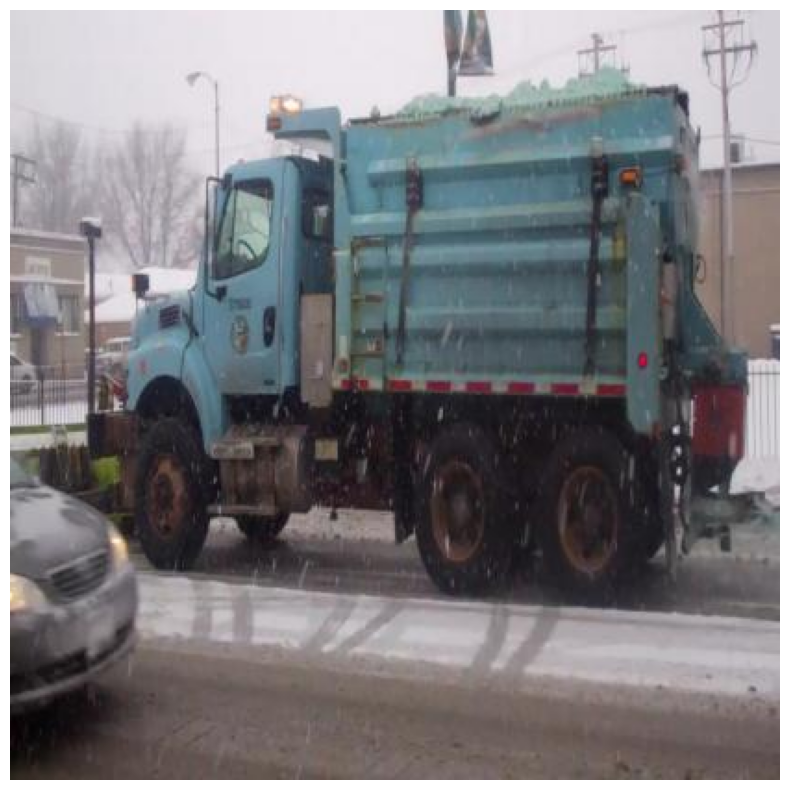


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/be3f71308b3598e9_jpg.rf.0895dab43842c01bcb8afc8b99d91c21.jpg


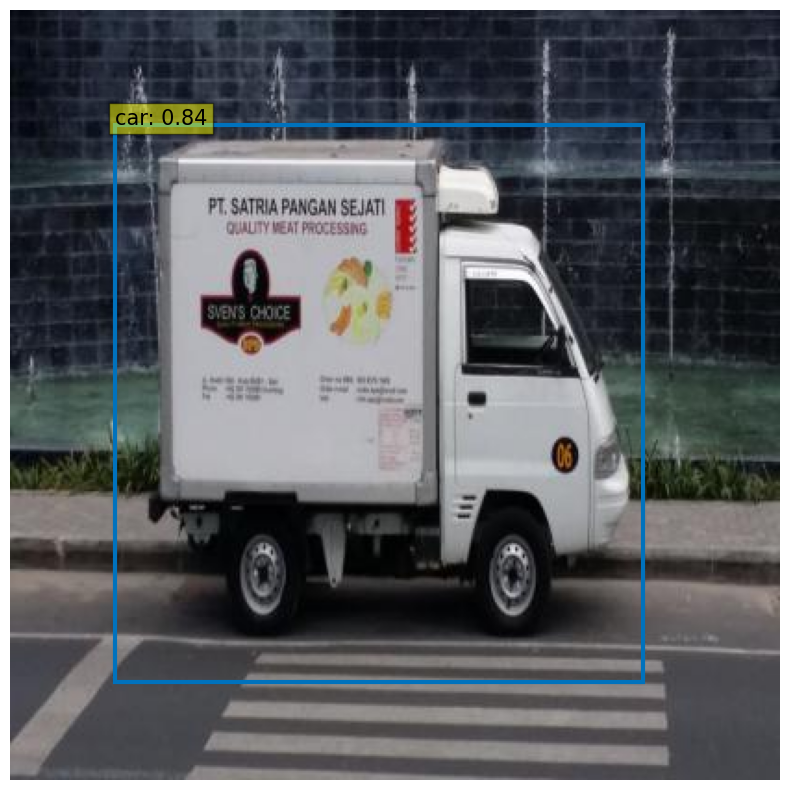


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/fcbbda4f0678bfcf_jpg.rf.ba5680ddca55276fe0495e0622f5af0d.jpg


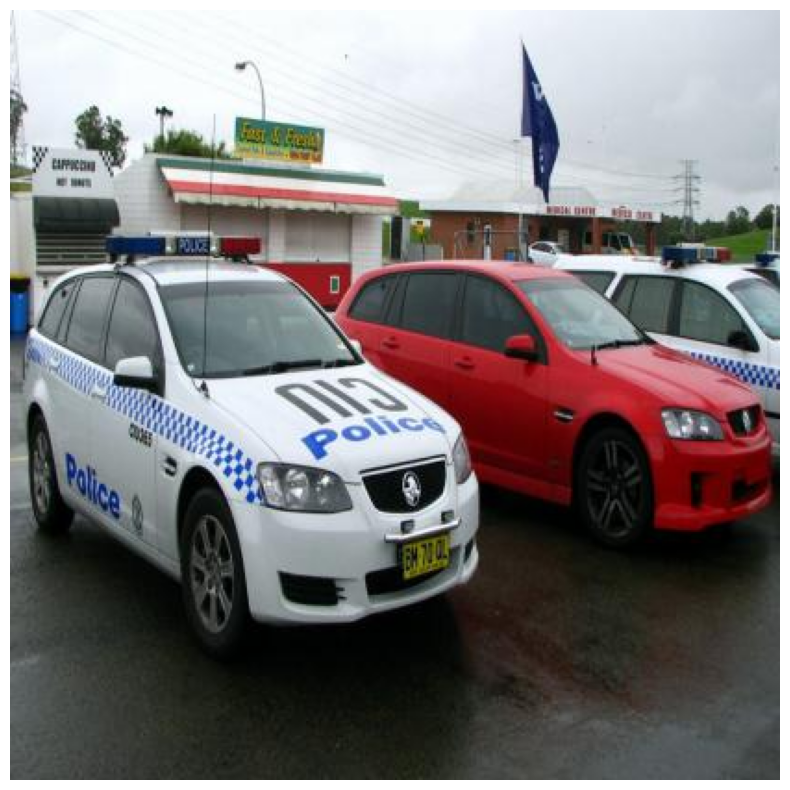


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/a3cffcdbff959432_jpg.rf.4MQ1NmvMx33nwLe9QSvu.jpg


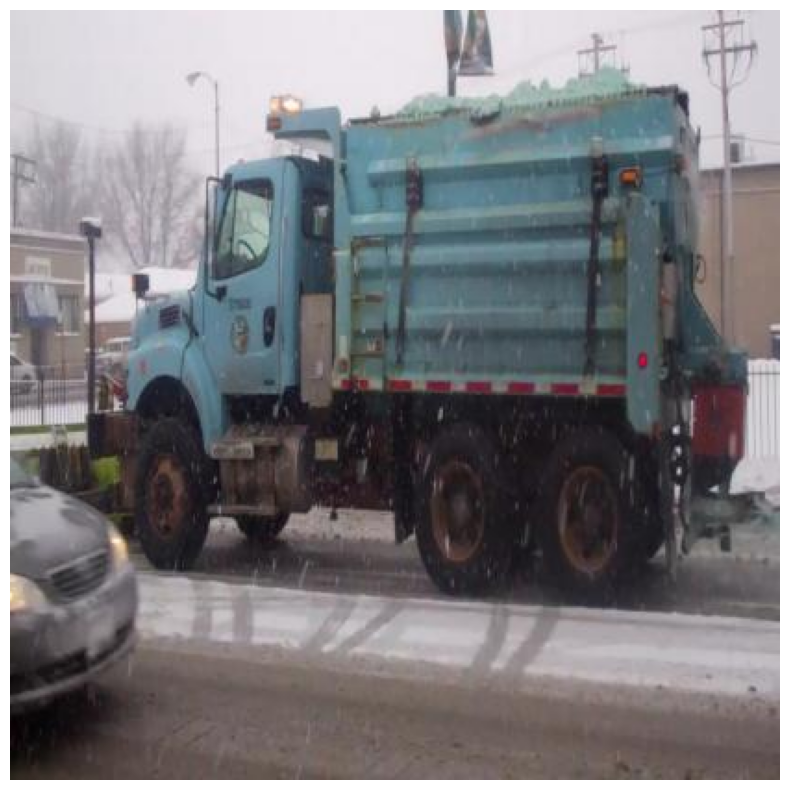


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/61b330a7098fba8b_jpg.rf.PvkjLyR5FqHNWALMC9tR.jpg


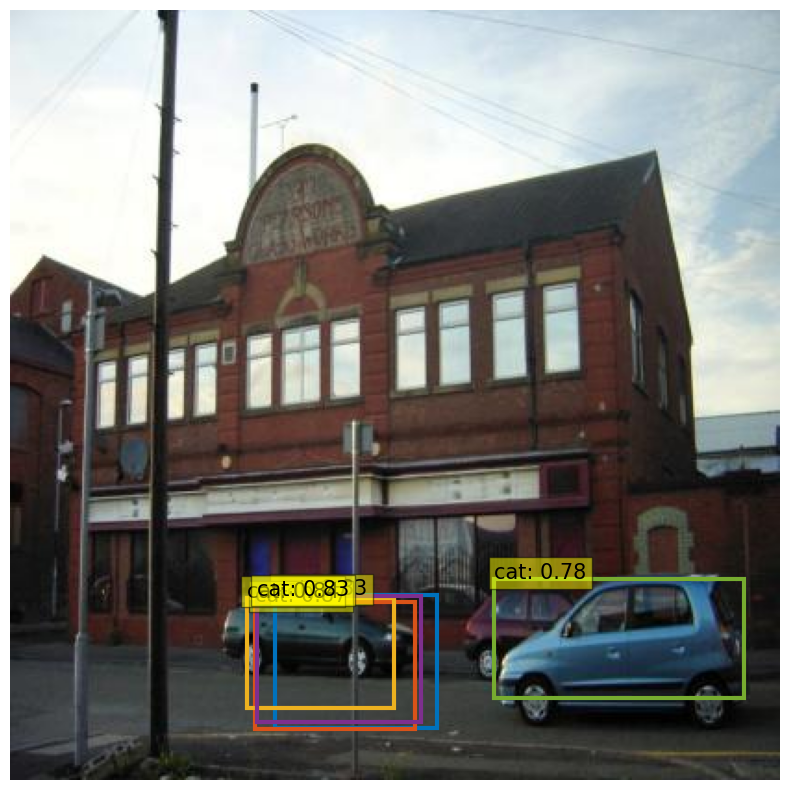


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/6a16101bb9217422_jpg.rf.8WKpVgqqjh9DUhom2WOC.jpg


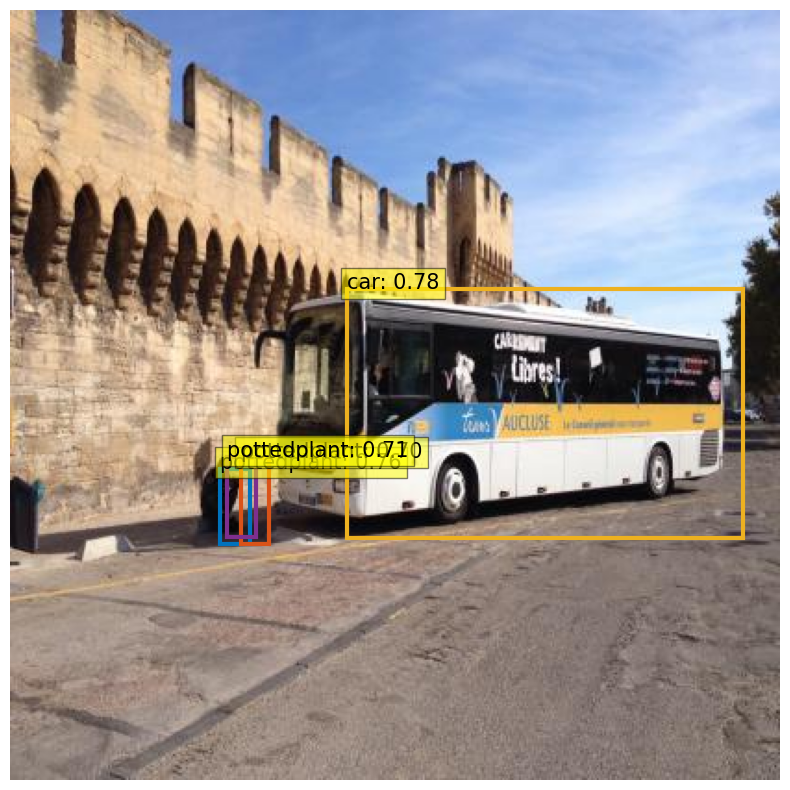


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/2c21c734126f9f69_jpg.rf.5b6a30b89f06d6dbe401038cb7caf396.jpg


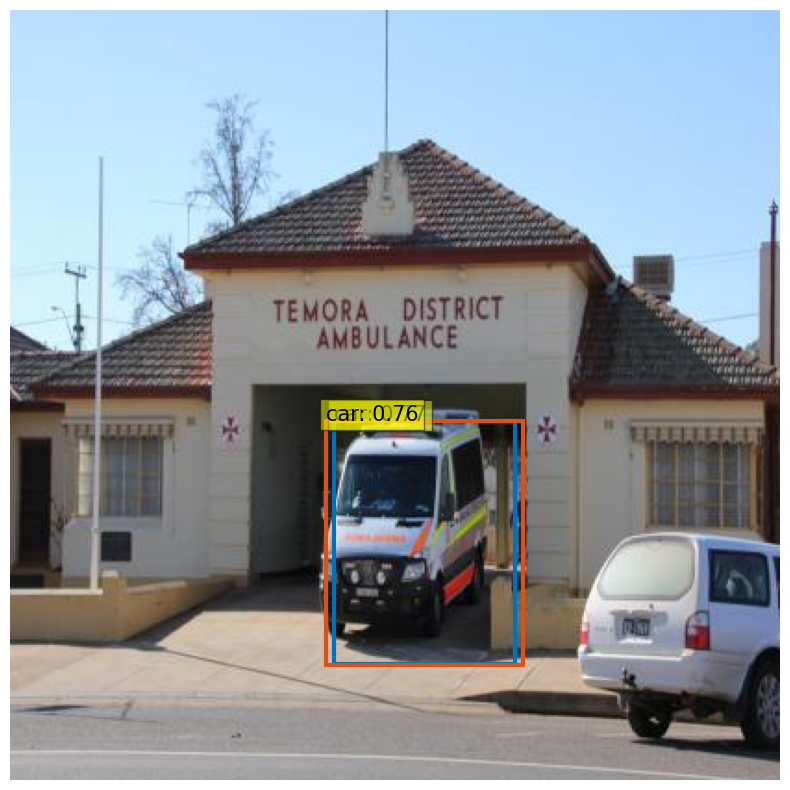


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/e36e433eed49a09d_jpg.rf.8826d7fb567c1288c0188105137f280a.jpg


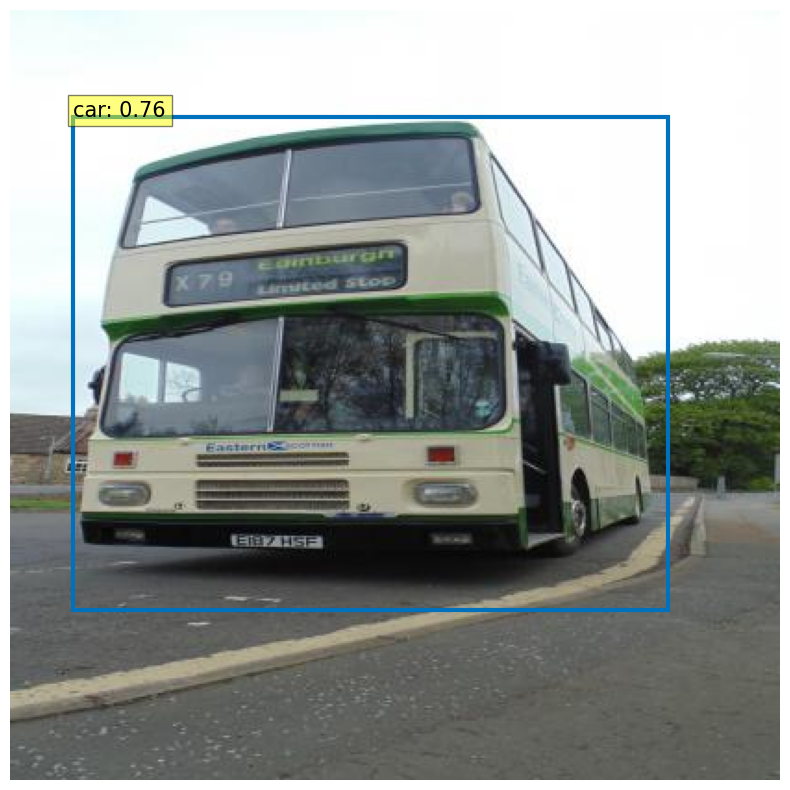


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/fb70621f1a194c73_jpg.rf.9WDZMyHpWqgrKoWWl23R.jpg


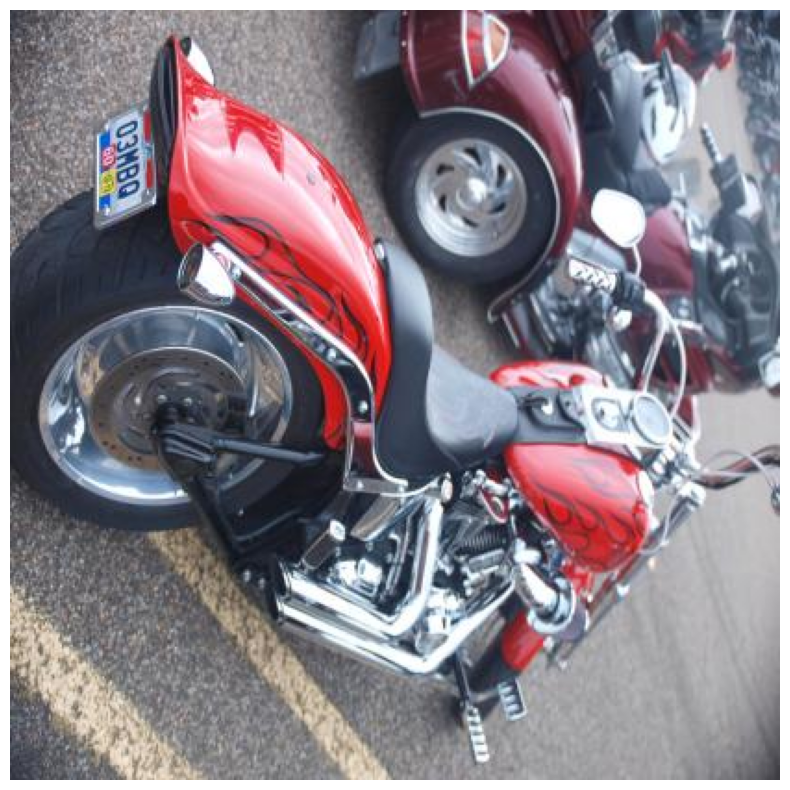


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/cf165ec304d2b2dc_jpg.rf.1038a595a2a468537b6b88d3abeb03c4.jpg


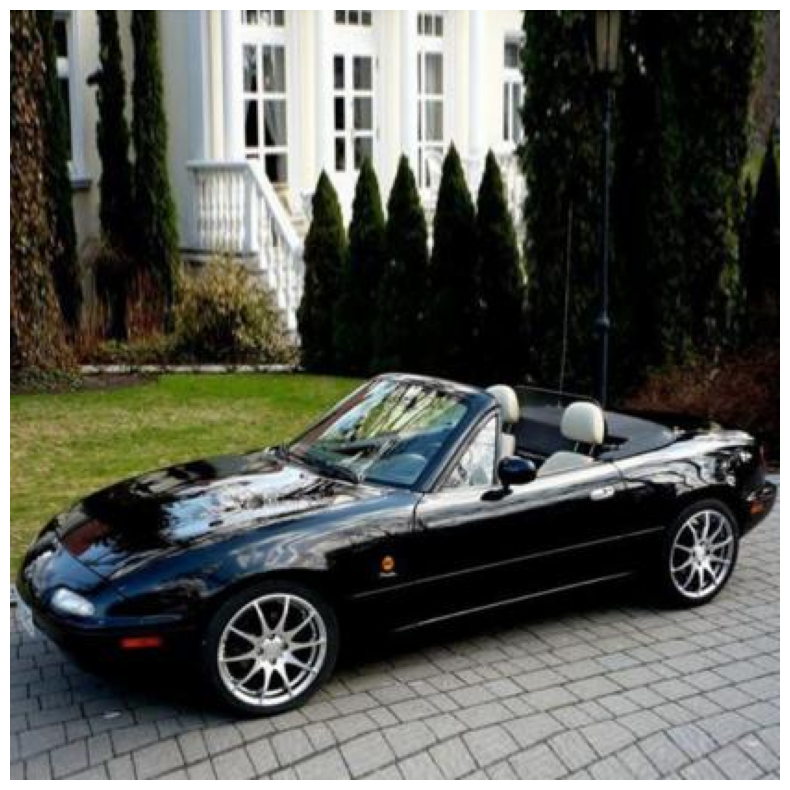


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/47b09b34e24b4039_jpg.rf.SXhYsnLDkwnvDNU811ds.jpg


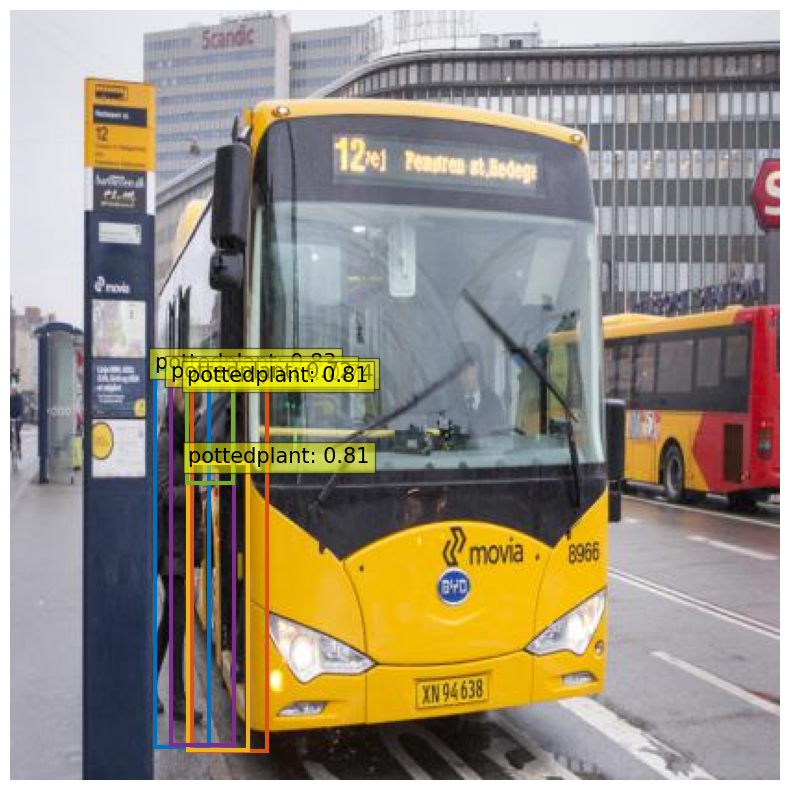


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg


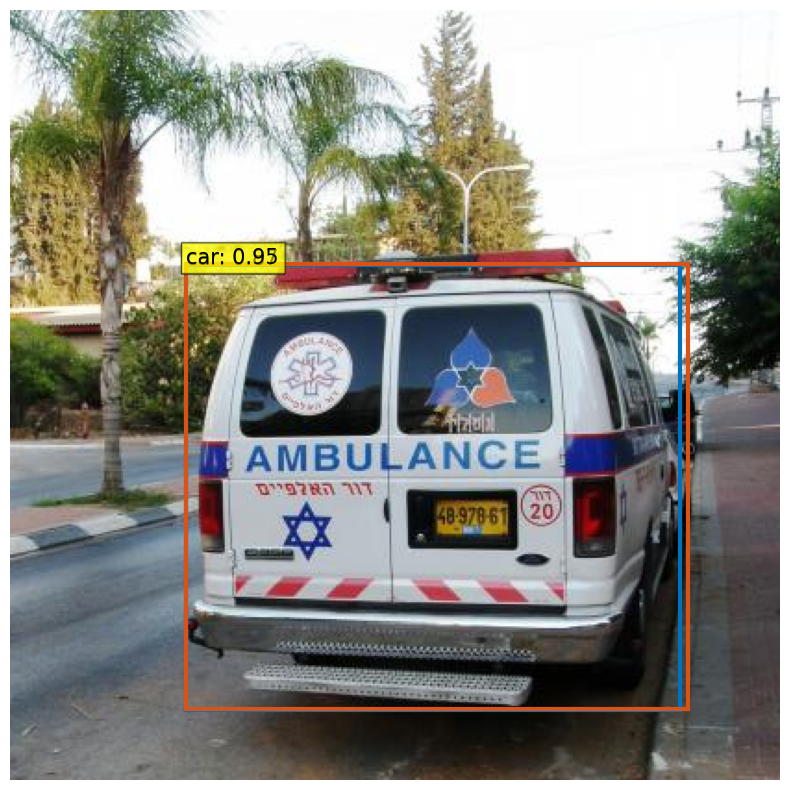


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/9d2d424099458956_jpg.rf.9cc91fddce7c7441e0f085d139b62aac.jpg


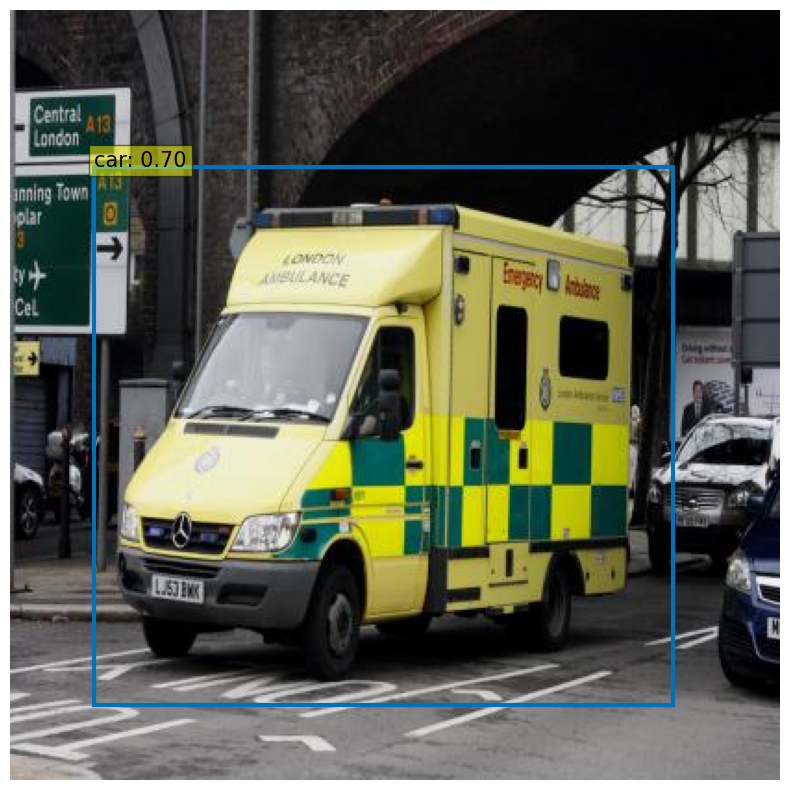


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/47b09b34e24b4039_jpg.rf.9274b35afd28c89ed4221e69e765e71d.jpg


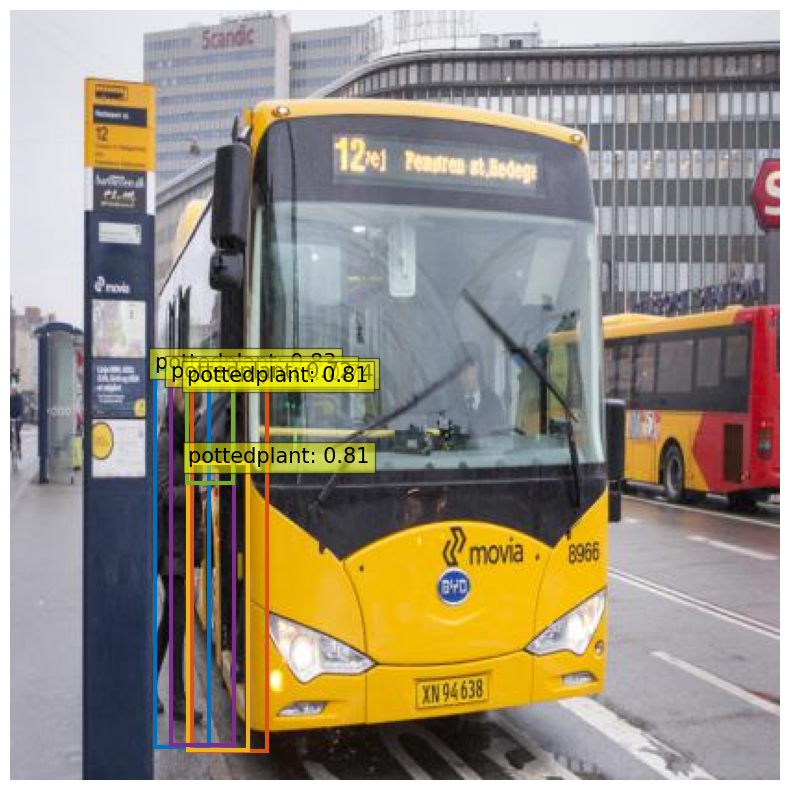


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/c6942c8aa585dfeb_jpg.rf.b19GcwKWIiFhEzZHUAQJ.jpg


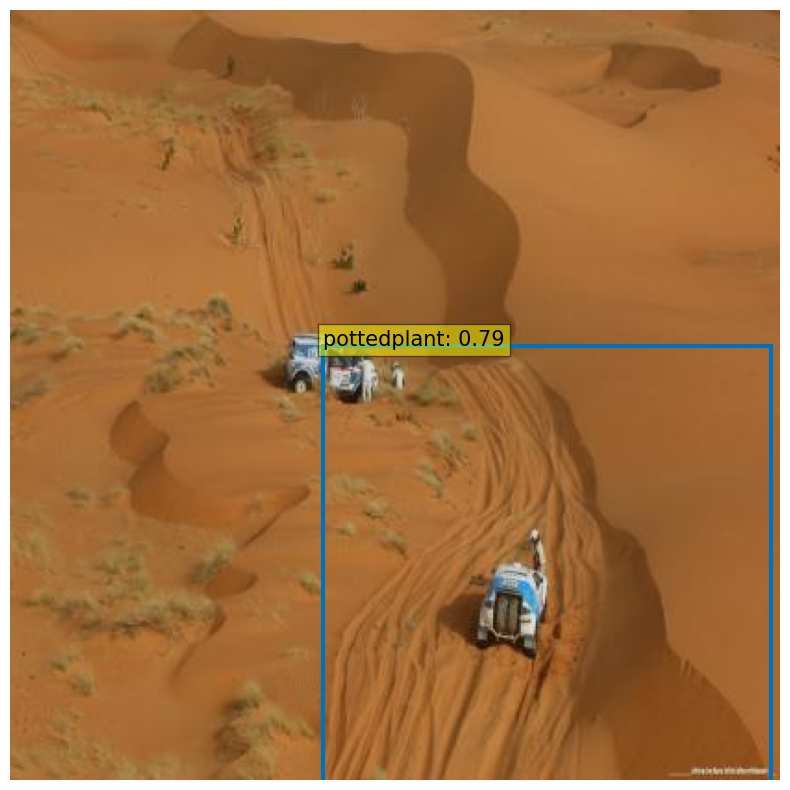


Processing image: /kaggle/input/cars-detection/Cars Detection/test/images/f00ec0093e986e99_jpg.rf.788065bc895796a1b381a68bb709d678.jpg


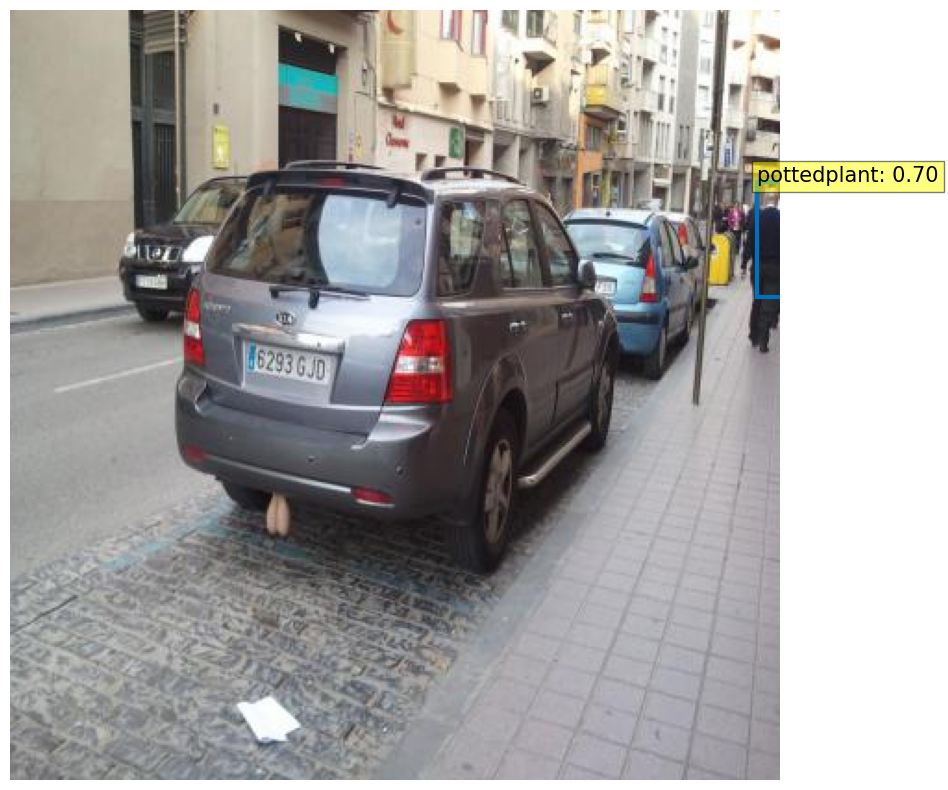

In [14]:
# --- STEP 6: RUN ON TEST IMAGES ---

test_dataset_path = '/kaggle/input/cars-detection/Cars Detection/test/images'

if os.path.exists(test_dataset_path):
    test_images = [os.path.join(test_dataset_path, f) for f in os.listdir(test_dataset_path) if f.endswith('.jpg')]
    
    # Select a few random images to test
    num_images_to_test = 20
    selected_images = np.random.choice(test_images, min(num_images_to_test, len(test_images)), replace=False)

    for image_path in selected_images:
        print(f"\nProcessing image: {image_path}")
        try:
            im = Image.open(image_path)
            scores, boxes = detect(im, model_actual, transform) 
            plot_results(im, scores, boxes)
        except Exception as e:
            print(f"Could not process image {image_path}. Error: {e}")

else:
    print(f"ERROR: Test dataset not found at '{test_dataset_path}'")
    print("Please ensure you have added the 'Car Object Detection' dataset and the path is correct.")